In [ ]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
movies=pd.read_csv('/content/drive/MyDrive/tmdb_5000_movies.csv')
credits=pd.read_csv('/content/drive/MyDrive/tmdb_5000_credits.csv')

In [ ]:
movies.head()

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,961000000,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500
2,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.sonypictures.com/movies/spectre/,206647,"[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2015-10-26,880674609,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,Spectre,6.3,4466
3,250000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 80, ""nam...",http://www.thedarkknightrises.com/,49026,"[{""id"": 849, ""name"": ""dc comics""}, {""id"": 853,...",en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-07-16,1084939099,165.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,The Legend Ends,The Dark Knight Rises,7.6,9106
4,260000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://movies.disney.com/john-carter,49529,"[{""id"": 818, ""name"": ""based on novel""}, {""id"":...",en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-03-07,284139100,132.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"Lost in our world, found in another.",John Carter,6.1,2124


In [ ]:
movies.describe()

,budget,id,popularity,revenue,runtime,vote_average,vote_count
count,4.803000e+03,4803.000000,4803.000000,4.803000e+03,4801.000000,4803.000000,4803.000000
mean,2.904504e+07,57165.484281,21.492301,8.226064e+07,106.875859,6.092172,690.217989
std,4.072239e+07,88694.614033,31.816650,1.628571e+08,22.611935,1.194612,1234.585891
min,0.000000e+00,5.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,7.900000e+05,9014.500000,4.668070,0.000000e+00,94.000000,5.600000,54.000000
50%,1.500000e+07,14629.000000,12.921594,1.917000e+07,103.000000,6.200000,235.000000
75%,4.000000e+07,58610.500000,28.313505,9.291719e+07,118.000000,6.800000,737.000000
max,3.800000e+08,459488.000000,875.581305,2.787965e+09,338.000000,10.000000,13752.000000


In [ ]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4803 entries, 0 to 4802
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                4803 non-null   int64  
 1   genres                4803 non-null   object 
 2   homepage              1712 non-null   object 
 3   id                    4803 non-null   int64  
 4   keywords              4803 non-null   object 
 5   original_language     4803 non-null   object 
 6   original_title        4803 non-null   object 
 7   overview              4800 non-null   object 
 8   popularity            4803 non-null   float64
 9   production_companies  4803 non-null   object 
 10  production_countries  4803 non-null   object 
 11  release_date          4802 non-null   object 
 12  revenue               4803 non-null   int64  
 13  runtime               4801 non-null   float64
 14  spoken_languages      4803 non-null   object 
 15  status               

In [ ]:
movies.shape

(4803, 20)

In [ ]:
movies.isnull().sum()

,0
budget,0
genres,0
homepage,3091
id,0
keywords,0
original_language,0
original_title,0
overview,3
popularity,0
production_companies,0


In [ ]:
credits.head(1)

,movie_id,title,cast,crew
0,19995,Avatar,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."


In [ ]:
credits.isnull().sum()

,0
movie_id,0
title,0
cast,0
crew,0


In [ ]:
credits.shape


(4803, 4)

In [ ]:
credits.crew

,crew
0,"[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."
1,"[{""credit_id"": ""52fe4232c3a36847f800b579"", ""de..."
2,"[{""credit_id"": ""54805967c3a36829b5002c41"", ""de..."
3,"[{""credit_id"": ""52fe4781c3a36847f81398c3"", ""de..."
4,"[{""credit_id"": ""52fe479ac3a36847f813eaa3"", ""de..."
...,...
4798,"[{""credit_id"": ""52fe44eec3a36847f80b280b"", ""de..."
4799,"[{""credit_id"": ""52fe487dc3a368484e0fb013"", ""de..."
4800,"[{""credit_id"": ""52fe4df3c3a36847f8275ecf"", ""de..."
4801,"[{""credit_id"": ""52fe4ad9c3a368484e16a36b"", ""de..."


In [ ]:
movies.genres[0]

'[{"id": 28, "name": "Action"}, {"id": 12, "name": "Adventure"}, {"id": 14, "name": "Fantasy"}, {"id": 878, "name": "Science Fiction"}]'

In [ ]:
import json

a=json.loads(movies.genres[0])   #string to list of dictionary
a

[{'id': 28, 'name': 'Action'},
 {'id': 12, 'name': 'Adventure'},
 {'id': 14, 'name': 'Fantasy'},
 {'id': 878, 'name': 'Science Fiction'}]

In [ ]:
a[0]['name'] #rough

'Action'

In [ ]:
for i in range(len(a)):
  print(a[i]['name'])    #rough

Action
Adventure
Fantasy
Science Fiction


In [ ]:
movies['genres']=movies['genres'].apply(lambda x:json.loads(x))



In [ ]:
type(movies['genres'][10])


list

In [ ]:
movies.genres[0]

[{'id': 28, 'name': 'Action'},
 {'id': 12, 'name': 'Adventure'},
 {'id': 14, 'name': 'Fantasy'},
 {'id': 878, 'name': 'Science Fiction'}]

In [ ]:
movies['genres']=movies['genres'].apply(lambda x: [g['name'] for g in x])

In [ ]:
movies.head(1)

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
0,237000000,"[{'id': 28, 'name': 'Action'}, {'id': 12, 'nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800


In [ ]:
movies.keywords[0]

'[{"id": 1463, "name": "culture clash"}, {"id": 2964, "name": "future"}, {"id": 3386, "name": "space war"}, {"id": 3388, "name": "space colony"}, {"id": 3679, "name": "society"}, {"id": 3801, "name": "space travel"}, {"id": 9685, "name": "futuristic"}, {"id": 9840, "name": "romance"}, {"id": 9882, "name": "space"}, {"id": 9951, "name": "alien"}, {"id": 10148, "name": "tribe"}, {"id": 10158, "name": "alien planet"}, {"id": 10987, "name": "cgi"}, {"id": 11399, "name": "marine"}, {"id": 13065, "name": "soldier"}, {"id": 14643, "name": "battle"}, {"id": 14720, "name": "love affair"}, {"id": 165431, "name": "anti war"}, {"id": 193554, "name": "power relations"}, {"id": 206690, "name": "mind and soul"}, {"id": 209714, "name": "3d"}]'

In [ ]:
b=json.loads(movies.keywords[0])  #rough
b

[{'id': 1463, 'name': 'culture clash'},
 {'id': 2964, 'name': 'future'},
 {'id': 3386, 'name': 'space war'},
 {'id': 3388, 'name': 'space colony'},
 {'id': 3679, 'name': 'society'},
 {'id': 3801, 'name': 'space travel'},
 {'id': 9685, 'name': 'futuristic'},
 {'id': 9840, 'name': 'romance'},
 {'id': 9882, 'name': 'space'},
 {'id': 9951, 'name': 'alien'},
 {'id': 10148, 'name': 'tribe'},
 {'id': 10158, 'name': 'alien planet'},
 {'id': 10987, 'name': 'cgi'},
 {'id': 11399, 'name': 'marine'},
 {'id': 13065, 'name': 'soldier'},
 {'id': 14643, 'name': 'battle'},
 {'id': 14720, 'name': 'love affair'},
 {'id': 165431, 'name': 'anti war'},
 {'id': 193554, 'name': 'power relations'},
 {'id': 206690, 'name': 'mind and soul'},
 {'id': 209714, 'name': '3d'}]

In [ ]:
for i in range(len(b)):   #rough
  print(b[i]['name'])

culture clash
future
space war
space colony
society
space travel
futuristic
romance
space
alien
tribe
alien planet
cgi
marine
soldier
battle
love affair
anti war
power relations
mind and soul
3d


In [ ]:
movies['keywords']=movies['keywords'].apply(lambda x:json.loads(x))


In [ ]:
movies.keywords[0]

[{'id': 1463, 'name': 'culture clash'},
 {'id': 2964, 'name': 'future'},
 {'id': 3386, 'name': 'space war'},
 {'id': 3388, 'name': 'space colony'},
 {'id': 3679, 'name': 'society'},
 {'id': 3801, 'name': 'space travel'},
 {'id': 9685, 'name': 'futuristic'},
 {'id': 9840, 'name': 'romance'},
 {'id': 9882, 'name': 'space'},
 {'id': 9951, 'name': 'alien'},
 {'id': 10148, 'name': 'tribe'},
 {'id': 10158, 'name': 'alien planet'},
 {'id': 10987, 'name': 'cgi'},
 {'id': 11399, 'name': 'marine'},
 {'id': 13065, 'name': 'soldier'},
 {'id': 14643, 'name': 'battle'},
 {'id': 14720, 'name': 'love affair'},
 {'id': 165431, 'name': 'anti war'},
 {'id': 193554, 'name': 'power relations'},
 {'id': 206690, 'name': 'mind and soul'},
 {'id': 209714, 'name': '3d'}]

In [ ]:
movies['keywords']=movies['keywords'].apply(lambda x: [g['name'] for g in x])

In [ ]:
movies.head(1)

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
0,237000000,"[Action, Adventure, Fantasy, Science Fiction]",http://www.avatarmovie.com/,19995,"[culture clash, future, space war, space colon...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800


In [ ]:
movies['production_companies']=movies['production_companies'].apply(lambda x:json.loads(x))


In [ ]:
movies['production_companies']=movies['production_companies'].apply(lambda x: [g['name'] for g in x])

In [ ]:
movies['production_countries']=movies['production_countries'].apply(lambda x:json.loads(x))

In [ ]:
movies['production_countries']=movies['production_countries'].apply(lambda x: [g['name'] for g in x])

In [ ]:
movies['spoken_languages']=movies['spoken_languages'].apply(lambda x:json.loads(x))

In [ ]:
movies['spoken_languages']=movies['spoken_languages'].apply(lambda x: [g['name'] for g in x])

In [ ]:
movies.head(5)

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
0,237000000,"[Action, Adventure, Fantasy, Science Fiction]",http://www.avatarmovie.com/,19995,"[culture clash, future, space war, space colon...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[Ingenious Film Partners, Twentieth Century Fo...","[United States of America, United Kingdom]",2009-12-10,2787965087,162.0,"[English, Español]",Released,Enter the World of Pandora.,Avatar,7.2,11800
1,300000000,"[Adventure, Fantasy, Action]",http://disney.go.com/disneypictures/pirates/,285,"[ocean, drug abuse, exotic island, east india ...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[Walt Disney Pictures, Jerry Bruckheimer Films...",[United States of America],2007-05-19,961000000,169.0,[English],Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500
2,245000000,"[Action, Adventure, Crime]",http://www.sonypictures.com/movies/spectre/,206647,"[spy, based on novel, secret agent, sequel, mi...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[Columbia Pictures, Danjaq, B24]","[United Kingdom, United States of America]",2015-10-26,880674609,148.0,"[Français, English, Español, Italiano, Deutsch]",Released,A Plan No One Escapes,Spectre,6.3,4466
3,250000000,"[Action, Crime, Drama, Thriller]",http://www.thedarkknightrises.com/,49026,"[dc comics, crime fighter, terrorist, secret i...",en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[Legendary Pictures, Warner Bros., DC Entertai...",[United States of America],2012-07-16,1084939099,165.0,[English],Released,The Legend Ends,The Dark Knight Rises,7.6,9106
4,260000000,"[Action, Adventure, Science Fiction]",http://movies.disney.com/john-carter,49529,"[based on novel, mars, medallion, space travel...",en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,[Walt Disney Pictures],[United States of America],2012-03-07,284139100,132.0,[English],Released,"Lost in our world, found in another.",John Carter,6.1,2124


In [ ]:
movies.iloc[140]

,140
budget,150000000
genres,"[Action, Drama, Thriller]"
homepage,NaN
id,117251
keywords,"[usa president, conspiracy, secret service, th..."
original_language,en
original_title,White House Down
overview,Capitol Policeman John Cale has just been deni...
popularity,39.004588
production_companies,"[Columbia Pictures, Centropolis Entertainment,..."


In [ ]:
movies.isnull().sum()

,0
budget,0
genres,0
homepage,3091
id,0
keywords,0
original_language,0
original_title,0
overview,3
popularity,0
production_companies,0


In [ ]:
#drpping homepage and tagline column (it have to many null values)

movies.drop(columns=['homepage','tagline'],axis=1,inplace=True)

In [ ]:
movies.columns

Index(['budget', 'genres', 'id', 'keywords', 'original_language',
       'original_title', 'overview', 'popularity', 'production_companies',
       'production_countries', 'release_date', 'revenue', 'runtime',
       'spoken_languages', 'status', 'title', 'vote_average', 'vote_count'],
      dtype='object')

In [ ]:
movies[movies.runtime.isnull()]

,budget,genres,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,title,vote_average,vote_count
2656,15000000,[Drama],370980,"[pope, biography]",it,Chiamatemi Francesco - Il Papa della gente,NaN,0.738646,[Taodue Film],[Italy],2015-12-03,0,NaN,[Español],Released,Chiamatemi Francesco - Il Papa della gente,7.3,12
4140,2,[Documentary],459488,"[music, actors, legendary perfomer, classic ho...",en,"To Be Frank, Sinatra at 100",NaN,0.050625,[Eyeline Entertainment],[United Kingdom],2015-12-12,0,NaN,[],Released,"To Be Frank, Sinatra at 100",0.0,0


In [ ]:
#better to delete runtime rows and other small ones

movies.dropna(inplace=True)

In [ ]:
movies.isnull().sum()

,0
budget,0
genres,0
id,0
keywords,0
original_language,0
original_title,0
overview,0
popularity,0
production_companies,0
production_countries,0


In [ ]:
#want release date in seprate columns years month and days

movies['release_date']=pd.to_datetime(movies['release_date'],errors='coerce')  #coerce fill missing value with nt instead of throwing errors



In [ ]:
movies['release_year']=movies['release_date'].dt.year
movies['release_month']=movies['release_date'].dt.month
movies['release_day']=movies['release_date'].dt.day

In [ ]:
movies.drop(columns=['release_date'],axis=1,inplace=True)

In [ ]:
movies.head()

,budget,genres,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,revenue,runtime,spoken_languages,status,title,vote_average,vote_count,release_year,release_month,release_day
0,237000000,"[Action, Adventure, Fantasy, Science Fiction]",19995,"[culture clash, future, space war, space colon...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[Ingenious Film Partners, Twentieth Century Fo...","[United States of America, United Kingdom]",2787965087,162.0,"[English, Español]",Released,Avatar,7.2,11800,2009,12,10
1,300000000,"[Adventure, Fantasy, Action]",285,"[ocean, drug abuse, exotic island, east india ...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[Walt Disney Pictures, Jerry Bruckheimer Films...",[United States of America],961000000,169.0,[English],Released,Pirates of the Caribbean: At World's End,6.9,4500,2007,5,19
2,245000000,"[Action, Adventure, Crime]",206647,"[spy, based on novel, secret agent, sequel, mi...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[Columbia Pictures, Danjaq, B24]","[United Kingdom, United States of America]",880674609,148.0,"[Français, English, Español, Italiano, Deutsch]",Released,Spectre,6.3,4466,2015,10,26
3,250000000,"[Action, Crime, Drama, Thriller]",49026,"[dc comics, crime fighter, terrorist, secret i...",en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[Legendary Pictures, Warner Bros., DC Entertai...",[United States of America],1084939099,165.0,[English],Released,The Dark Knight Rises,7.6,9106,2012,7,16
4,260000000,"[Action, Adventure, Science Fiction]",49529,"[based on novel, mars, medallion, space travel...",en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,[Walt Disney Pictures],[United States of America],284139100,132.0,[English],Released,John Carter,6.1,2124,2012,3,7


In [ ]:
#cleaning credits section

In [ ]:
credits.head(1)

,movie_id,title,cast,crew
0,19995,Avatar,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."


In [ ]:
credits.isnull().sum()

,0
movie_id,0
title,0
cast,0
crew,0


In [ ]:
#cleaning cast and crew column

In [ ]:
credits.cast[0]

'[{"cast_id": 242, "character": "Jake Sully", "credit_id": "5602a8a7c3a3685532001c9a", "gender": 2, "id": 65731, "name": "Sam Worthington", "order": 0}, {"cast_id": 3, "character": "Neytiri", "credit_id": "52fe48009251416c750ac9cb", "gender": 1, "id": 8691, "name": "Zoe Saldana", "order": 1}, {"cast_id": 25, "character": "Dr. Grace Augustine", "credit_id": "52fe48009251416c750aca39", "gender": 1, "id": 10205, "name": "Sigourney Weaver", "order": 2}, {"cast_id": 4, "character": "Col. Quaritch", "credit_id": "52fe48009251416c750ac9cf", "gender": 2, "id": 32747, "name": "Stephen Lang", "order": 3}, {"cast_id": 5, "character": "Trudy Chacon", "credit_id": "52fe48009251416c750ac9d3", "gender": 1, "id": 17647, "name": "Michelle Rodriguez", "order": 4}, {"cast_id": 8, "character": "Selfridge", "credit_id": "52fe48009251416c750ac9e1", "gender": 2, "id": 1771, "name": "Giovanni Ribisi", "order": 5}, {"cast_id": 7, "character": "Norm Spellman", "credit_id": "52fe48009251416c750ac9dd", "gender": 

In [ ]:
credits['cast']=credits['cast'].apply(lambda x:json.loads(x))

In [ ]:
credits['cast']=credits['cast'].apply(lambda x: [g['name'] for g in x])

In [ ]:
credits.cast[0]

['Sam Worthington',
 'Zoe Saldana',
 'Sigourney Weaver',
 'Stephen Lang',
 'Michelle Rodriguez',
 'Giovanni Ribisi',
 'Joel David Moore',
 'CCH Pounder',
 'Wes Studi',
 'Laz Alonso',
 'Dileep Rao',
 'Matt Gerald',
 'Sean Anthony Moran',
 'Jason Whyte',
 'Scott Lawrence',
 'Kelly Kilgour',
 'James Patrick Pitt',
 'Sean Patrick Murphy',
 'Peter Dillon',
 'Kevin Dorman',
 'Kelson Henderson',
 'David Van Horn',
 'Jacob Tomuri',
 'Michael Blain-Rozgay',
 'Jon Curry',
 'Luke Hawker',
 'Woody Schultz',
 'Peter Mensah',
 'Sonia Yee',
 'Jahnel Curfman',
 'Ilram Choi',
 'Kyla Warren',
 'Lisa Roumain',
 'Debra Wilson',
 'Chris Mala',
 'Taylor Kibby',
 'Jodie Landau',
 'Julie Lamm',
 'Cullen B. Madden',
 'Joseph Brady Madden',
 'Frankie Torres',
 'Austin Wilson',
 'Sara Wilson',
 'Tamica Washington-Miller',
 'Lucy Briant',
 'Nathan Meister',
 'Gerry Blair',
 'Matthew Chamberlain',
 'Paul Yates',
 'Wray Wilson',
 'James Gaylyn',
 'Melvin Leno Clark III',
 'Carvon Futrell',
 'Brandon Jelkes',
 'Mica

In [ ]:
credits.crew[0]

'[{"credit_id": "52fe48009251416c750aca23", "department": "Editing", "gender": 0, "id": 1721, "job": "Editor", "name": "Stephen E. Rivkin"}, {"credit_id": "539c47ecc3a36810e3001f87", "department": "Art", "gender": 2, "id": 496, "job": "Production Design", "name": "Rick Carter"}, {"credit_id": "54491c89c3a3680fb4001cf7", "department": "Sound", "gender": 0, "id": 900, "job": "Sound Designer", "name": "Christopher Boyes"}, {"credit_id": "54491cb70e0a267480001bd0", "department": "Sound", "gender": 0, "id": 900, "job": "Supervising Sound Editor", "name": "Christopher Boyes"}, {"credit_id": "539c4a4cc3a36810c9002101", "department": "Production", "gender": 1, "id": 1262, "job": "Casting", "name": "Mali Finn"}, {"credit_id": "5544ee3b925141499f0008fc", "department": "Sound", "gender": 2, "id": 1729, "job": "Original Music Composer", "name": "James Horner"}, {"credit_id": "52fe48009251416c750ac9c3", "department": "Directing", "gender": 2, "id": 2710, "job": "Director", "name": "James Cameron"},

In [ ]:
credits['crew']=credits['crew'].apply(lambda x:json.loads(x))

In [ ]:
credits['crew_departments']=credits['crew'].apply(lambda x: [g['department'] for g in x])  #all departments name

In [ ]:
credits['crew_names']=credits['crew'].apply(lambda x: [g['name'] for g in x])  #all crew names

In [ ]:
credits['director_name]']=credits['crew'].apply(lambda x: [g['name'] for g in x if g['job']=='Director']) #directors name

In [ ]:
credits.head(1)

,movie_id,title,cast,crew,crew_departments,crew_names,director_name]
0,19995,Avatar,"[Sam Worthington, Zoe Saldana, Sigourney Weave...","[{'credit_id': '52fe48009251416c750aca23', 'de...","[Editing, Art, Sound, Sound, Production, Sound...","[Stephen E. Rivkin, Rick Carter, Christopher B...",[James Cameron]


In [ ]:
merged_df=pd.merge(movies, credits, left_on='id', right_on='movie_id')


In [ ]:
merged_df.head()

,budget,genres,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,...,release_year,release_month,release_day,movie_id,title_y,cast,crew,crew_departments,crew_names,director_name]
0,237000000,"[Action, Adventure, Fantasy, Science Fiction]",19995,"[culture clash, future, space war, space colon...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[Ingenious Film Partners, Twentieth Century Fo...","[United States of America, United Kingdom]",...,2009,12,10,19995,Avatar,"[Sam Worthington, Zoe Saldana, Sigourney Weave...","[{'credit_id': '52fe48009251416c750aca23', 'de...","[Editing, Art, Sound, Sound, Production, Sound...","[Stephen E. Rivkin, Rick Carter, Christopher B...",[James Cameron]
1,300000000,"[Adventure, Fantasy, Action]",285,"[ocean, drug abuse, exotic island, east india ...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[Walt Disney Pictures, Jerry Bruckheimer Films...",[United States of America],...,2007,5,19,285,Pirates of the Caribbean: At World's End,"[Johnny Depp, Orlando Bloom, Keira Knightley, ...","[{'credit_id': '52fe4232c3a36847f800b579', 'de...","[Camera, Directing, Production, Writing, Writi...","[Dariusz Wolski, Gore Verbinski, Jerry Bruckhe...",[Gore Verbinski]
2,245000000,"[Action, Adventure, Crime]",206647,"[spy, based on novel, secret agent, sequel, mi...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[Columbia Pictures, Danjaq, B24]","[United Kingdom, United States of America]",...,2015,10,26,206647,Spectre,"[Daniel Craig, Christoph Waltz, Léa Seydoux, R...","[{'credit_id': '54805967c3a36829b5002c41', 'de...","[Sound, Directing, Art, Writing, Writing, Art,...","[Thomas Newman, Sam Mendes, Anna Pinnock, John...",[Sam Mendes]
3,250000000,"[Action, Crime, Drama, Thriller]",49026,"[dc comics, crime fighter, terrorist, secret i...",en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[Legendary Pictures, Warner Bros., DC Entertai...",[United States of America],...,2012,7,16,49026,The Dark Knight Rises,"[Christian Bale, Michael Caine, Gary Oldman, A...","[{'credit_id': '52fe4781c3a36847f81398c3', 'de...","[Sound, Production, Writing, Directing, Produc...","[Hans Zimmer, Charles Roven, Christopher Nolan...",[Christopher Nolan]
4,260000000,"[Action, Adventure, Science Fiction]",49529,"[based on novel, mars, medallion, space travel...",en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,[Walt Disney Pictures],[United States of America],...,2012,3,7,49529,John Carter,"[Taylor Kitsch, Lynn Collins, Samantha Morton,...","[{'credit_id': '52fe479ac3a36847f813eaa3', 'de...","[Writing, Directing, Crew, Production, Product...","[Andrew Stanton, Andrew Stanton, John Lasseter...",[Andrew Stanton]


In [ ]:
merged_df.drop('movie_id',axis=1,inplace=True) #id and movie_id is same

In [ ]:
merged_df.isnull().sum()

,0
budget,0
genres,0
id,0
keywords,0
original_language,0
original_title,0
overview,0
popularity,0
production_companies,0
production_countries,0


In [ ]:
merged_df.columns


Index(['budget', 'genres', 'id', 'keywords', 'original_language',
       'original_title', 'overview', 'popularity', 'production_companies',
       'production_countries', 'revenue', 'runtime', 'spoken_languages',
       'status', 'title_x', 'vote_average', 'vote_count', 'release_year',
       'release_month', 'release_day', 'title_y', 'cast', 'crew',
       'crew_departments', 'crew_names', 'director_name]'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import LabelEncoder #encoding features

copydf=merged_df.copy()


In [ ]:
v=merged_df.copy()

In [ ]:
v.columns

Index(['budget', 'genres', 'id', 'keywords', 'original_language',
       'original_title', 'overview', 'popularity', 'production_companies',
       'production_countries', 'revenue', 'runtime', 'spoken_languages',
       'status', 'title_x', 'vote_average', 'vote_count', 'release_year',
       'release_month', 'release_day', 'title_y', 'cast', 'crew',
       'crew_departments', 'crew_names', 'director_name]'],
      dtype='object')

In [ ]:
#converting list into string beacuse sklearn ,random forest cannot handle list

categorical_cols = [
    'genres', 'cast', 'crew_departments', 'crew_names', 'director_name]',
    'original_title', 'keywords', 'production_companies',
    'production_countries', 'spoken_languages','overview','title_y','original_language','status','title_x'
]

for col in categorical_cols:
    if col in v.columns:
        v[col] = v[col].astype(str)




In [ ]:
categorical_cols = [
    'genres', 'cast', 'crew_departments', 'crew_names', 'director_name]',
    'original_title', 'keywords', 'production_companies',
    'production_countries', 'spoken_languages','overview','title_y','original_language','status','title_x'
]
encoder={}

for col in categorical_cols:
  if col in v.columns:
    le=LabelEncoder()
    v[col]=le.fit_transform(v[col])
    encoder[col]=le
    print(f"mapping for '{col}': \n{dict(zip(le.classes_,le.transform(le.classes_)))}\n")




mapping for 'genres': 
{"['Action', 'Adventure', 'Animation', 'Comedy', 'Family', 'Fantasy', 'Romance']": np.int64(0), "['Action', 'Adventure', 'Animation', 'Comedy', 'Family', 'Fantasy', 'Science Fiction']": np.int64(1), "['Action', 'Adventure', 'Animation', 'Comedy', 'Family']": np.int64(2), "['Action', 'Adventure', 'Animation', 'Comedy', 'Science Fiction']": np.int64(3), "['Action', 'Adventure', 'Animation', 'Family', 'Fantasy']": np.int64(4), "['Action', 'Adventure', 'Animation', 'Family']": np.int64(5), "['Action', 'Adventure', 'Animation', 'Fantasy', 'Science Fiction']": np.int64(6), "['Action', 'Adventure', 'Animation', 'Science Fiction', 'Thriller']": np.int64(7), "['Action', 'Adventure', 'Comedy', 'Crime', 'Drama']": np.int64(8), "['Action', 'Adventure', 'Comedy', 'Crime', 'Mystery', 'Thriller']": np.int64(9), "['Action', 'Adventure', 'Comedy', 'Crime', 'Romance', 'Thriller']": np.int64(10), "['Action', 'Adventure', 'Comedy', 'Crime', 'Thriller']": np.int64(11), "['Action', 'A

In [ ]:
#v = v.rename(columns={'director_name]': 'director_name'})


In [ ]:
v.drop('crew',axis=1,inplace=True)

In [ ]:
v.columns

Index(['budget', 'genres', 'id', 'keywords', 'original_language',
       'original_title', 'overview', 'popularity', 'production_companies',
       'production_countries', 'revenue', 'runtime', 'spoken_languages',
       'status', 'title_x', 'vote_average', 'vote_count', 'release_year',
       'release_month', 'release_day', 'title_y', 'cast', 'crew_departments',
       'crew_names', 'director_name]'],
      dtype='object')

In [ ]:
v.title_x[0]

np.int64(378)

In [ ]:
v.spoken_languages[0]

np.int64(120)

In [ ]:
v.head(1)

,budget,genres,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,...,vote_average,vote_count,release_year,release_month,release_day,title_y,cast,crew_departments,crew_names,director_name]
0,237000000,61,19995,1036,7,371,2523,150.437577,1393,466,...,7.2,11800,2009,12,10,378,3986,1219,4123,926


Ml part

In [ ]:
x=v.drop('vote_average',axis=1)
y=v['vote_average']

In [ ]:
from sklearn.model_selection import KFold, cross_val_score

kf=KFold(n_splits=5,shuffle=True,random_state=42)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

In [ ]:
rf=RandomForestRegressor()

In [ ]:
accuracy=[]
for train_index,test_index in kf.split(x,y):
  x_train,x_test=x.iloc[train_index],x.iloc[test_index]
  y_train,y_test=y.iloc[train_index],y.iloc[test_index]

  rf.fit(x_train,y_train)
  y_pred=rf.predict(x_test)

  accuracy.append(mean_squared_error(y_test,y_pred))

print("mse for each fold:",accuracy)
print("average mse:",np.mean(accuracy))

mse for each fold: [0.49994357187500005, 0.5173081052083331, 0.6176272416666666, 0.6179328281249998, 0.6224962252346194]
average mse: 0.5750615944219237


In [ ]:
z=pd.DataFrame({'actual_rating':y_test, 'predicted_rating':y_pred})
z

,actual_rating,predicted_rating
3,7.6,7.228
4,6.1,6.138
5,5.9,6.847
9,5.7,6.758
10,5.4,6.637
...,...,...
4771,6.3,5.050
4784,6.2,6.402
4785,6.7,6.106
4791,6.0,6.217


In [ ]:
#features importance basd on that we remove less importance features to check model accuracy
#before removing the accuracy is 56%

In [ ]:
rf.fit(x,y)
fimportance=pd.Series(rf.feature_importances_,index=x.columns)
fimportance=fimportance.sort_values(ascending=False)
fimportance

,0
vote_count,0.449330
runtime,0.105935
id,0.053083
budget,0.048262
genres,0.047569
popularity,0.030335
release_year,0.026567
cast,0.024855
director_name],0.021476
crew_departments,0.021123


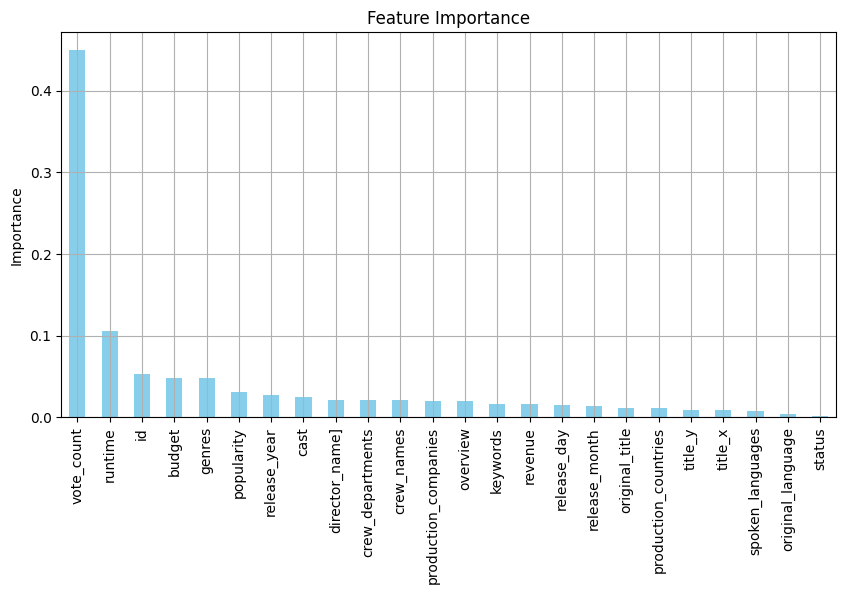

In [ ]:
# Visualizing feature importance

plt.figure(figsize=(10,5))
fimportance.plot(kind='bar', color='skyblue')
plt.title("Feature Importance")
plt.ylabel("Importance")
plt.grid()
plt.show()


removng less unwanted features for better performance


In [ ]:
v2=v.copy()

In [ ]:
v2.columns

Index(['budget', 'genres', 'id', 'keywords', 'original_language',
       'original_title', 'overview', 'popularity', 'production_companies',
       'production_countries', 'revenue', 'runtime', 'spoken_languages',
       'status', 'title_x', 'vote_average', 'vote_count', 'release_year',
       'release_month', 'release_day', 'title_y', 'cast', 'crew_departments',
       'crew_names', 'director_name]'],
      dtype='object')

In [ ]:
v2.drop(columns=['keywords', 'original_language',
       'original_title', 'overview','production_companies',
       'production_countries', 'revenue', 'spoken_languages',
       'status', 'title_x','release_year',
       'release_month', 'release_day', 'title_y', 'cast', 'crew_departments',
       'crew_names', 'director_name]'],axis=1,inplace=True)

In [ ]:
v2.columns

Index(['budget', 'genres', 'id', 'popularity', 'runtime', 'vote_average',
       'vote_count'],
      dtype='object')

In [ ]:
x1=v2.drop('vote_average',axis=1)
y1=v2['vote_average']

In [ ]:
rf1=RandomForestRegressor()

In [ ]:
accuracy1=[]
for train1_index,test1_index in kf.split(x1,y1):
  x1_train,x1_test=x1.iloc[train1_index],x1.iloc[test1_index]
  y1_train,y1_test=y1.iloc[train1_index],y1.iloc[test1_index]

  rf1.fit(x1_train,y1_train)
  y1_pred=rf1.predict(x1_test)

  accuracy1.append(mean_squared_error(y1_test,y1_pred))

print("mse for each fold:",accuracy1)
print("average mse:",np.mean(accuracy1))

mse for each fold: [0.4872407760416667, 0.5560847666666667, 0.6045687156249999, 0.6318266687499999, 0.6312403722627739]
average mse: 0.5821922598692215


In [ ]:
merged_df.title_x

,title_x
0,Avatar
1,Pirates of the Caribbean: At World's End
2,Spectre
3,The Dark Knight Rises
4,John Carter
...,...
4794,El Mariachi
4795,Newlyweds
4796,"Signed, Sealed, Delivered"
4797,Shanghai Calling


In [ ]:
v3=v.copy()

In [ ]:
v3.head()

,budget,genres,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,...,vote_average,vote_count,release_year,release_month,release_day,title_y,cast,crew_departments,crew_names,director_name]
0,237000000,61,19995,1036,7,371,2523,150.437577,1393,466,...,7.2,11800,2009,12,10,378,3986,1219,4123,926
1,300000000,338,285,2750,7,2662,1661,139.082615,3533,467,...,6.9,4500,2007,5,19,2645,2307,299,1006,807
2,245000000,41,206647,3635,7,3185,212,107.376788,532,415,...,6.3,4466,2015,10,26,3178,986,3219,4434,2029
3,250000000,131,49026,1088,7,3591,2075,112.312950,1560,467,...,7.6,9106,2012,7,16,3609,820,3592,1743,389
4,260000000,75,49529,378,7,1888,2793,43.926995,3570,467,...,6.1,2124,2012,3,7,1898,4342,3798,188,113


In [ ]:
v3.drop(columns=['original_language',
       'original_title','production_companies',
       'production_countries','spoken_languages',
       'status','title_x','release_month', 'release_day'],axis=1,inplace=True)

In [ ]:
v3.head(1)

,budget,genres,id,keywords,overview,popularity,revenue,runtime,vote_average,vote_count,release_year,title_y,cast,crew_departments,crew_names,director_name]
0,237000000,61,19995,1036,2523,150.437577,2787965087,162.0,7.2,11800,2009,378,3986,1219,4123,926


In [ ]:
v3.columns

Index(['budget', 'genres', 'id', 'keywords', 'overview', 'popularity',
       'revenue', 'runtime', 'vote_average', 'vote_count', 'release_year',
       'title_y', 'cast', 'crew_departments', 'crew_names', 'director_name]'],
      dtype='object')

In [ ]:
x2=v3.drop('vote_average',axis=1)
y2=v3['vote_average']

In [ ]:
rf2=RandomForestRegressor()

In [ ]:
accuracy2=[]
for train2_index,test2_index in kf.split(x2,y2):
  x2_train,x2_test=x2.iloc[train2_index],x2.iloc[test2_index]
  y2_train,y2_test=y2.iloc[train2_index],y2.iloc[test2_index]

  rf2.fit(x2_train,y2_train)
  y2_pred=rf2.predict(x2_test)

  accuracy2.append(mean_squared_error(y2_test,y2_pred))

print("mse for each fold:",accuracy2)
print("average mse:",np.mean(accuracy2))

mse for each fold: [0.5019352854166665, 0.5313279875, 0.6046156302083333, 0.6173927197916667, 0.6336894598540147]
average mse: 0.5777922165541363


<Axes: >

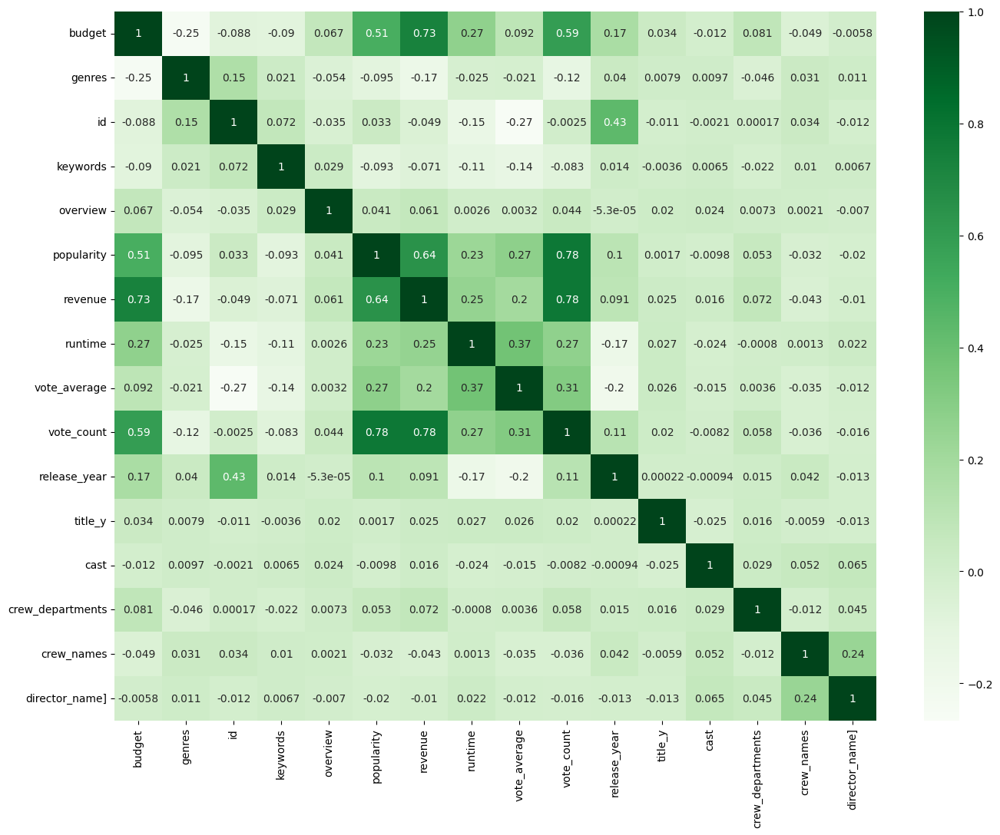

In [ ]:
plt.figure(figsize=(16, 12))
sns.heatmap(v3.corr(),annot=True,cmap='Greens')

removing less imortance features are not helping actually


Movie Recommendation part

In [ ]:
Rdataset=merged_df.copy()

In [ ]:
Rdataset.rename(columns={'director_name]':'director_name'},inplace=True)

In [ ]:
Rdataset.head(1)

,budget,genres,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,...,vote_count,release_year,release_month,release_day,title_y,cast,crew,crew_departments,crew_names,director_name
0,237000000,"[Action, Adventure, Fantasy, Science Fiction]",19995,"[culture clash, future, space war, space colon...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[Ingenious Film Partners, Twentieth Century Fo...","[United States of America, United Kingdom]",...,11800,2009,12,10,Avatar,"[Sam Worthington, Zoe Saldana, Sigourney Weave...","[{'credit_id': '52fe48009251416c750aca23', 'de...","[Editing, Art, Sound, Sound, Production, Sound...","[Stephen E. Rivkin, Rick Carter, Christopher B...",[James Cameron]


In [ ]:
Rdataset.isnull().sum()

,0
budget,0
genres,0
id,0
keywords,0
original_language,0
original_title,0
overview,0
popularity,0
production_companies,0
production_countries,0


In [ ]:
Rdataset.columns

Index(['budget', 'genres', 'id', 'keywords', 'original_language',
       'original_title', 'overview', 'popularity', 'production_companies',
       'production_countries', 'revenue', 'runtime', 'spoken_languages',
       'status', 'title_x', 'vote_average', 'vote_count', 'release_year',
       'release_month', 'release_day', 'title_y', 'cast', 'crew',
       'crew_departments', 'crew_names', 'director_name'],
      dtype='object')

In [ ]:
text_features=['genres','keywords','cast','crew_departments','crew_names','director_name']

In [ ]:
for col in text_features:               #ensuring all features in in string
  Rdataset[col]=Rdataset[col].astype(str)

In [ ]:
Rdataset['tags']=Rdataset[text_features].apply(lambda row:' '.join(row), axis=1)

In [ ]:
Rdataset.tags

,tags
0,"['Action', 'Adventure', 'Fantasy', 'Science Fi..."
1,"['Adventure', 'Fantasy', 'Action'] ['ocean', '..."
2,"['Action', 'Adventure', 'Crime'] ['spy', 'base..."
3,"['Action', 'Crime', 'Drama', 'Thriller'] ['dc ..."
4,"['Action', 'Adventure', 'Science Fiction'] ['b..."
...,...
4794,"['Action', 'Crime', 'Thriller'] ['united state..."
4795,"['Comedy', 'Romance'] [] ['Edward Burns', 'Ker..."
4796,"['Comedy', 'Drama', 'Romance', 'TV Movie'] ['d..."
4797,"[] [] ['Daniel Henney', 'Eliza Coupe', 'Bill P..."


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
tfidf=TfidfVectorizer(stop_words='english')
tfidf_matrix=tfidf.fit_transform(Rdataset['tags'])


In [ ]:
tfidf_matrix

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 529195 stored elements and shape (4799, 62109)>

In [ ]:
from sklearn.neighbors import NearestNeighbors    #nearestneighbors for reccomendation because no target ,knn for predection

In [ ]:
knn=NearestNeighbors(n_neighbors=6,metric='cosine') #cosine for similarity

In [ ]:
knn.fit(tfidf_matrix)

NearestNeighbors(metric='cosine', n_neighbors=6)

In [ ]:
def recommend_movie(title, num_recommendations=5):
    # Check if movie exists
    if title not in Rdataset['original_title'].values:
        print("Movie not found!")
        return []

    # Get index of the movie
    idx = Rdataset[Rdataset['original_title'] == title].index[0]

    # Find nearest neighbors
    distances, indices = knn.kneighbors(tfidf_matrix[idx], n_neighbors=num_recommendations+1)

    # Skip the movie itself (first one)
    recommended_indices = indices[0][1:]

    # Return recommended movies
    return Rdataset.iloc[recommended_indices][['original_title', 'genres', 'vote_average']]


In [ ]:
recommend_movie('Avatar')

,original_title,genres,vote_average
28,Jurassic World,"['Action', 'Adventure', 'Science Fiction', 'Th...",6.5
1422,The X Files: I Want to Believe,"['Drama', 'Mystery', 'Science Fiction', 'Thril...",5.5
231,"Monsters, Inc.","['Animation', 'Comedy', 'Family']",7.5
412,The Core,"['Action', 'Thriller', 'Adventure', 'Science F...",5.4
212,The Day After Tomorrow,"['Action', 'Adventure', 'Science Fiction', 'Th...",6.2


In [ ]:
import pickle
from google.colab import files

# saving the trained KNN model
with open('model.pkl', 'wb') as f:
    pickle.dump(knn, f)

# Saving the TF-IDF vectorizer
with open('vectorizer.pkl', 'wb') as f:
    pickle.dump(tfidf, f)



# Downloading the files to your local machine
files.download('model.pkl')
files.download('vectorizer.pkl')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
with open('dataset.pkl', 'wb') as f:
    pickle.dump(Rdataset, f)

files.download('dataset.pkl')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>